### Reqirements
- keras >= 2.2.0 or tensorflow >= 1.13
- segmenation-models==1.0.*

In [1]:
# Install required libs

# ### please update Albumentations to version>=0.3.0 for `Lambda` transform support
# !pip3 install -U albumentations>=0.3.0 --user 
# !pip3 install -U --pre segmentation-models --user

In [2]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
import time

import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

import tensorflow as tf
import keras
config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.5
keras.backend.set_session(tf.Session(config=config))


Bad key "text.kerning_factor" on line 4 in
/home/ruslan/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution
/home/ruslan/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/ruslan/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/ruslan/.local/lib/python3.6/site-packages/tensorflow/python/fr

# Utility functions 

In [3]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()
    
# helper function for data visualization    
def denormalize(x):
    """Scale image to range 0..1 for correct plot"""
    x_max = np.percentile(x, 98)
    x_min = np.percentile(x, 2)    
    x = (x - x_min) / (x_max - x_min)
    x = x.clip(0, 1)
    return x

# Segmentation model training

In [4]:
import segmentation_models as sm

# segmentation_models could also use `tf.keras` if you do not have Keras installed
# or you could switch to other framework using `sm.set_framework('tf.keras')`

Segmentation Models: using `keras` framework.


In [5]:
BACKBONE = 'resnet18' #'mobilenetv2'
CLASSES = ['current']

preprocess_input = sm.get_preprocessing(BACKBONE)

In [6]:
# define network parameters
n_classes = len(CLASSES) if len(CLASSES) == 1 else len(CLASSES)+1  # case for binary and multiclass segmentation
activation = 'sigmoid' if n_classes == 1 else 'softmax'

#create model
model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)

# If it producess an SSl-error do the following:
# 1. wget --no-check-certificate WEIGHTS_PATH
# 2. mv WEIGHTS_FILE ~/.keras/models

In [7]:
# define optomizer
optim = 'Adam'

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
# set class weights for dice_loss (background: 0.5; current: 2.; neighbour: 2.; )
dice_loss = sm.losses.DiceLoss(class_weights=np.array([1.0])) 
focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

# compile keras model with defined optimozer, loss and metrics
model.compile(optim, total_loss)

In [8]:
# load best weights
model.load_weights('trained_models/unet-resnet18-berkeley-drivable-192x320.h5')
# model.load_weights('trained_models/mobilenetv2-berkeley-drivable-192x320.h5')

# Test on video stream (NVIDIA Jetson Nano)

In [9]:
preprocess_input = sm.get_preprocessing(BACKBONE)
def image_preprocessing(image, size=(192, 320)):
    # convert color
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # apply preprocessing
    image = cv2.resize(image, (size[1], size[0]), cv2.INTER_LINEAR)
    image = preprocess_input(image)
    img_processed = np.expand_dims(image, axis=0)
    return img_processed

In [10]:
def visual_seg_result(image, seg_mask):
    # Generate fake R & B color dimensions, stack with G
    size = (seg_mask[0].shape[:2])
    blanks = np.zeros(size).astype(np.uint8)
    lane_drawn = np.dstack((blanks, seg_mask[0], blanks))

    # # Re-size to match the original image
    lane_image = cv2.resize(lane_drawn, (image.shape[1], image.shape[0]))

    # Merge the lane drawing onto the original image
    result = 0.7* denormalize(frame_raw) + 0.3 * lane_image
    return result

In [36]:
from tqdm import tqdm

vs = cv2.VideoCapture('/home/ruslan/Desktop/moscow_streets.mp4')
SIZE = (192, 320)

FPS = []
# while(1):
for i in tqdm( range(100) ):
    # get raw frames from video stream
    ret, frame_raw = vs.read()
    if ret == False:
        break
    # preprocess raw frames
    frame = image_preprocessing(frame_raw, SIZE)
    # predict segmentation mask from the frame
    start = time.time()
    pr_mask = model.predict(frame)
    dt = time.time() - start
    FPS.append(1./dt)
    # print("[INFO] single frame took {:.4f} seconds".format(dt))
    segmented_result = visual_seg_result(frame_raw, pr_mask)

#     visualize(
#         image=denormalize(frame.squeeze()),
#         pr_mask=pr_mask[..., 0].squeeze(),
#         result=segmented_result,
#     )

print("[INFO] Mean FPS {:.4f} Hz".format(np.mean(FPS[1:])))

100%|██████████| 100/100 [00:02<00:00, 45.53it/s]

[INFO] Mean FPS 116.6204 Hz


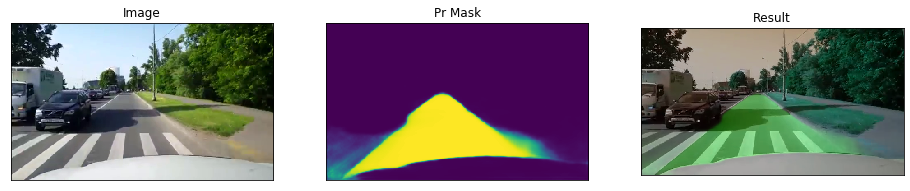

In [37]:
visualize(
    image=denormalize(frame.squeeze()),
    pr_mask=pr_mask[..., 0].squeeze(),
    result=segmented_result,
)

### Test on images of a sidewalk (NVIDIA GeForce RTX 2080)

  0%|          | 0/131 [00:00<?, ?it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0238 seconds


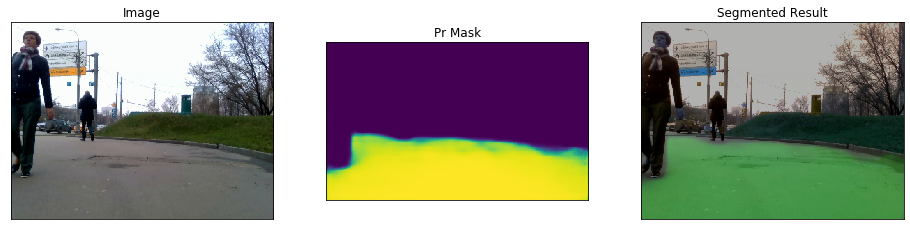

  1%|          | 1/131 [00:00<00:30,  4.27it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0091 seconds


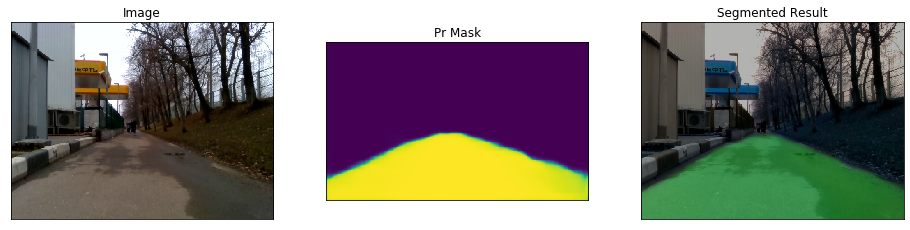

  2%|▏         | 2/131 [00:00<00:29,  4.37it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0090 seconds


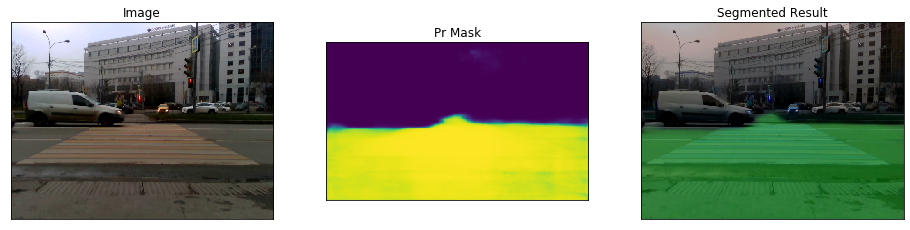

  2%|▏         | 3/131 [00:00<00:29,  4.40it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0090 seconds


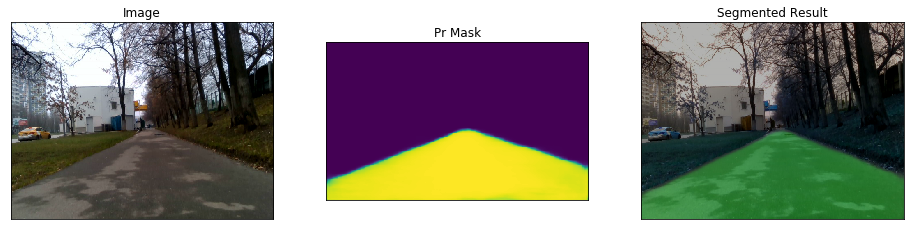

  3%|▎         | 4/131 [00:00<00:28,  4.45it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0087 seconds


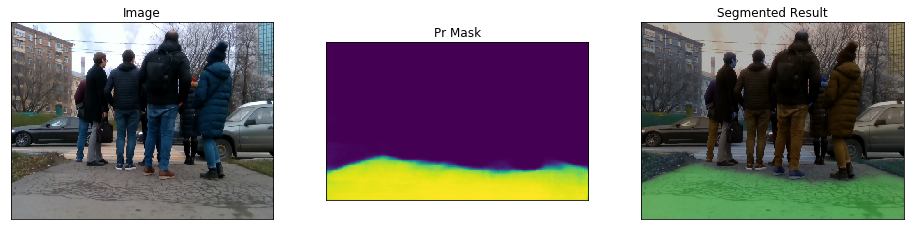

  4%|▍         | 5/131 [00:01<00:28,  4.47it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0090 seconds


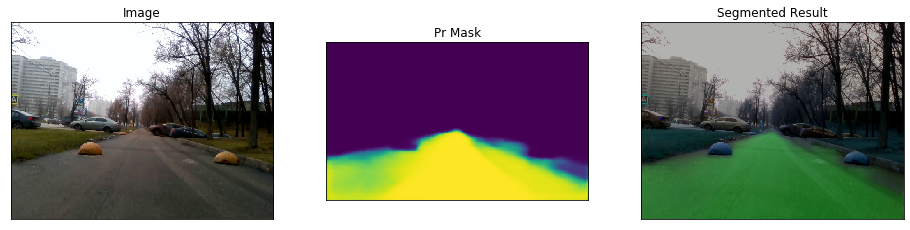

  5%|▍         | 6/131 [00:01<00:27,  4.53it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0092 seconds


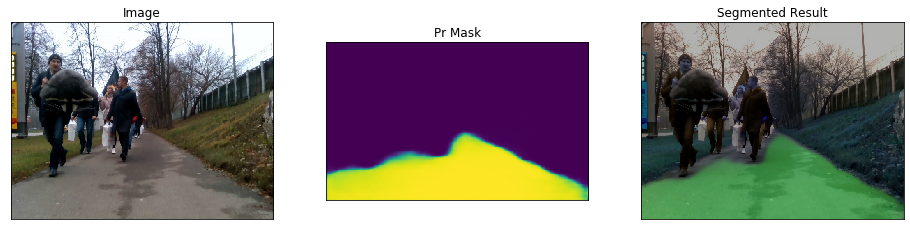

  5%|▌         | 7/131 [00:01<00:27,  4.54it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0090 seconds


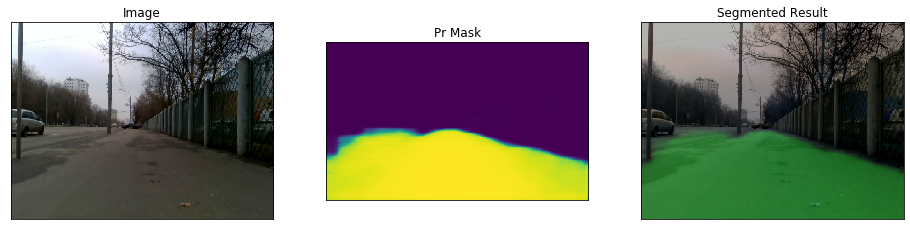

  6%|▌         | 8/131 [00:01<00:26,  4.58it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0090 seconds


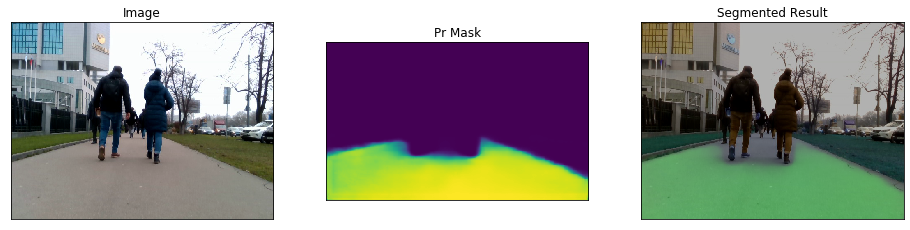

  7%|▋         | 9/131 [00:01<00:26,  4.53it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0090 seconds


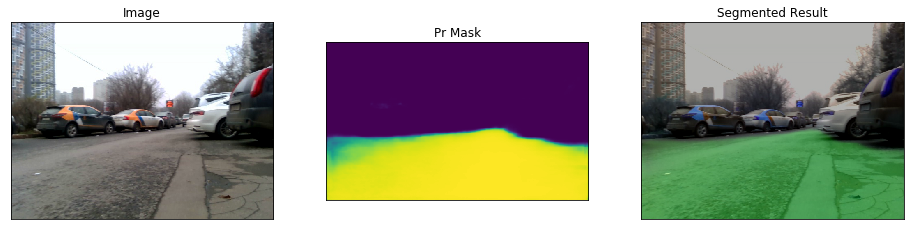

  8%|▊         | 10/131 [00:02<00:26,  4.62it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0090 seconds


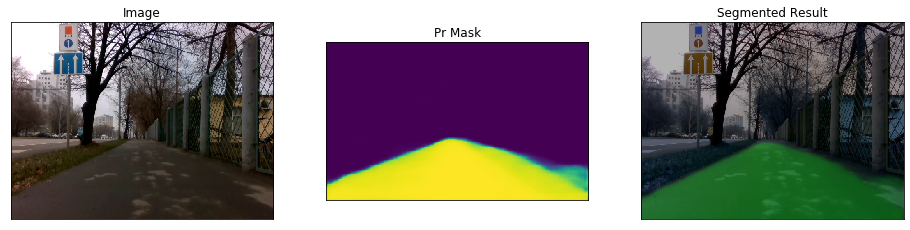

  8%|▊         | 11/131 [00:02<00:25,  4.62it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0089 seconds


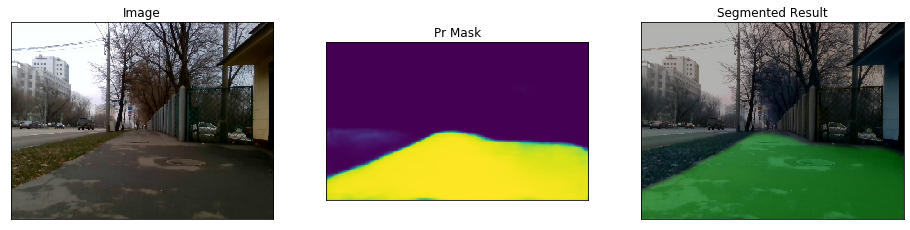

  9%|▉         | 12/131 [00:02<00:25,  4.63it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0091 seconds


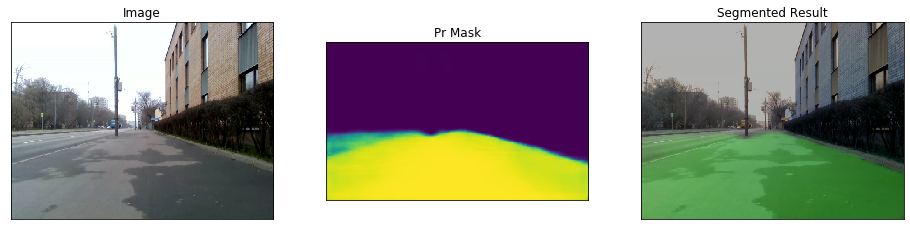

 10%|▉         | 13/131 [00:02<00:25,  4.69it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0091 seconds


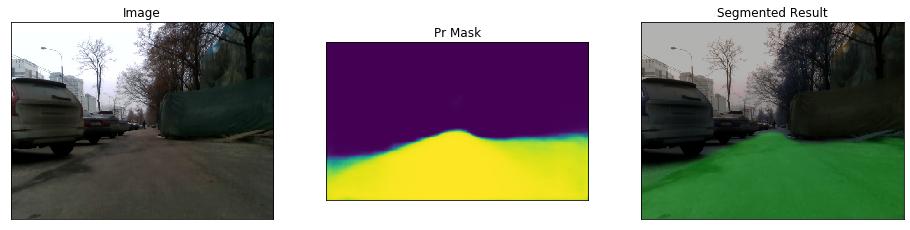

 11%|█         | 14/131 [00:03<00:24,  4.70it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0088 seconds


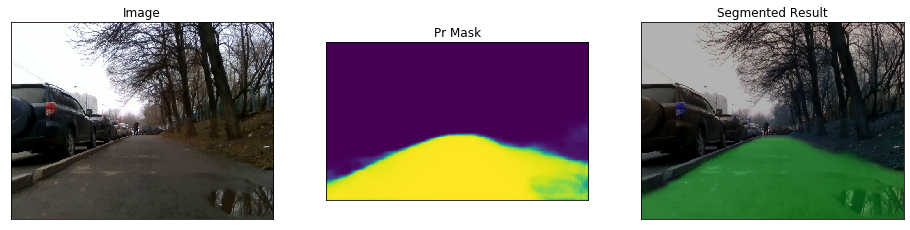

 11%|█▏        | 15/131 [00:03<00:24,  4.69it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0090 seconds


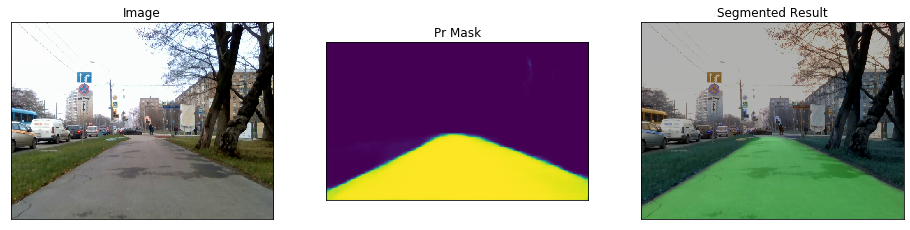

 12%|█▏        | 16/131 [00:03<00:24,  4.73it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0091 seconds


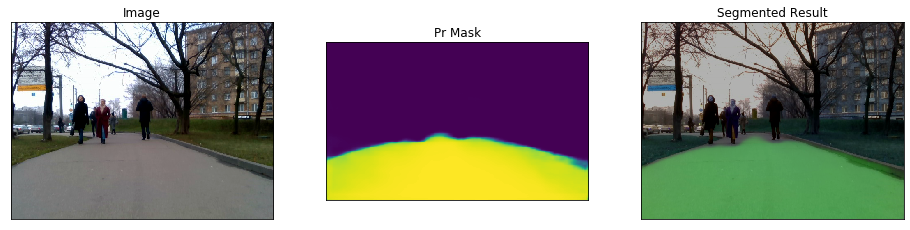

 13%|█▎        | 17/131 [00:03<00:24,  4.67it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0090 seconds


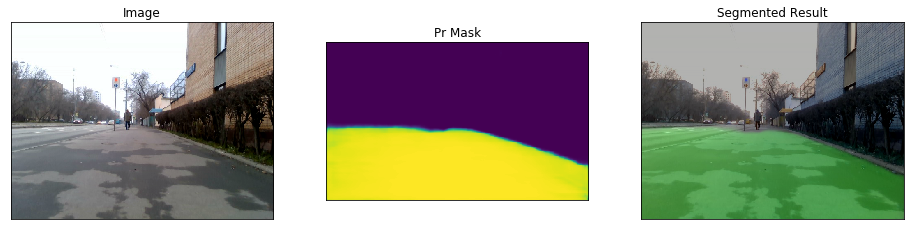

 14%|█▎        | 18/131 [00:03<00:24,  4.68it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0087 seconds


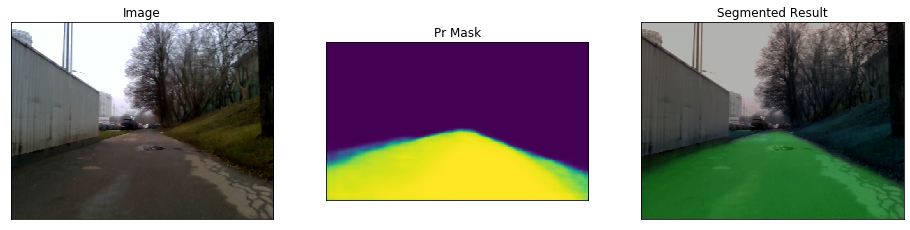

 15%|█▍        | 19/131 [00:04<00:23,  4.68it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0089 seconds


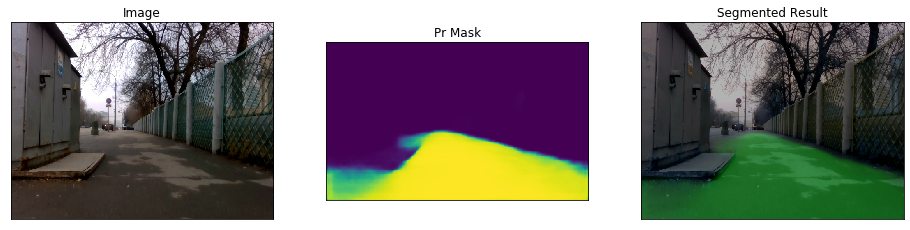

 15%|█▌        | 20/131 [00:04<00:23,  4.65it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0092 seconds


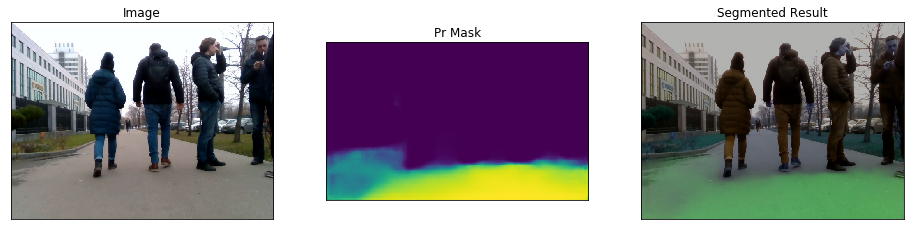

 16%|█▌        | 21/131 [00:04<00:23,  4.62it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0090 seconds


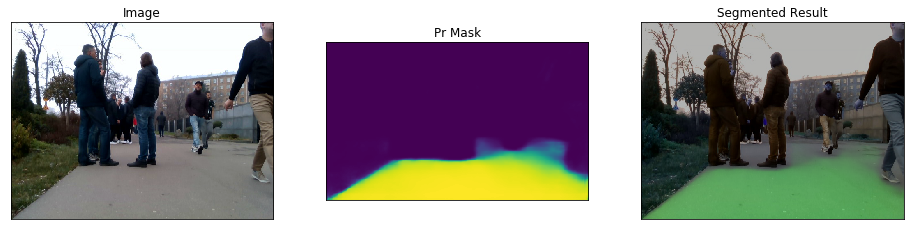

 17%|█▋        | 22/131 [00:04<00:23,  4.63it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0089 seconds


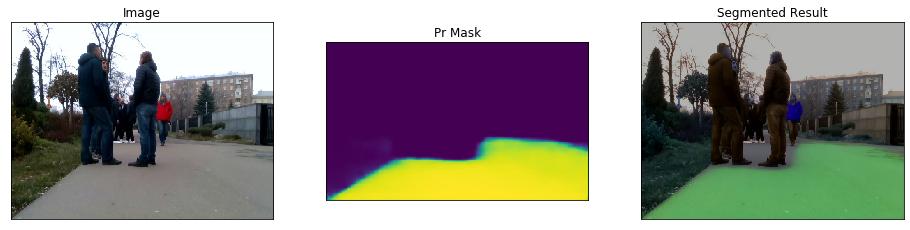

 18%|█▊        | 23/131 [00:04<00:23,  4.66it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0092 seconds


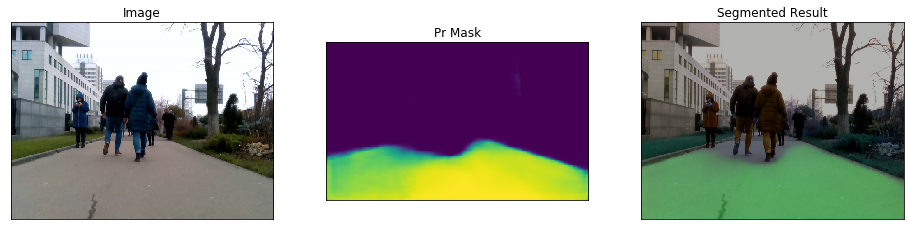

 18%|█▊        | 24/131 [00:05<00:22,  4.67it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0089 seconds


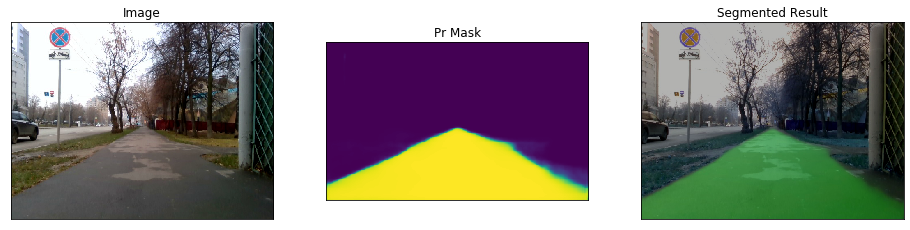

 19%|█▉        | 25/131 [00:05<00:22,  4.68it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0091 seconds


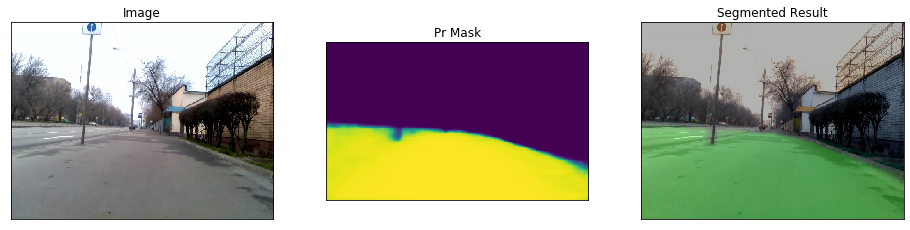

 20%|█▉        | 26/131 [00:05<00:22,  4.73it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0091 seconds


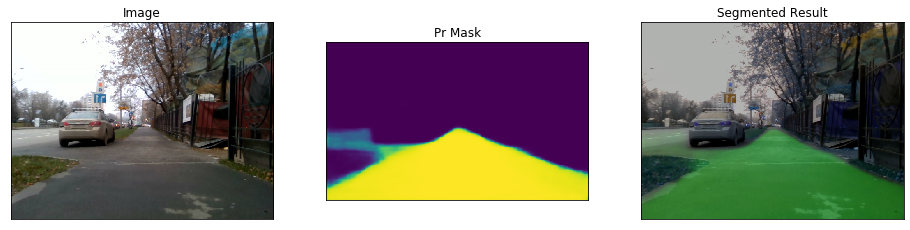

 21%|██        | 27/131 [00:05<00:21,  4.75it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0093 seconds


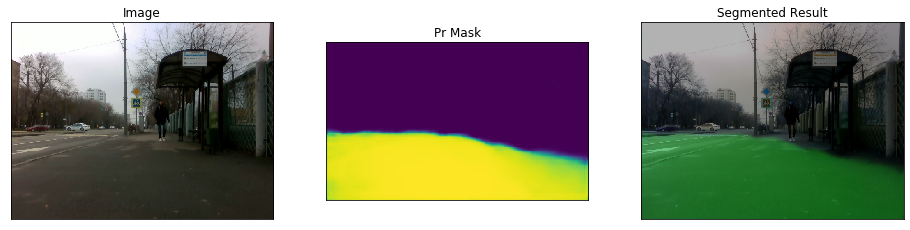

 21%|██▏       | 28/131 [00:06<00:22,  4.65it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0091 seconds


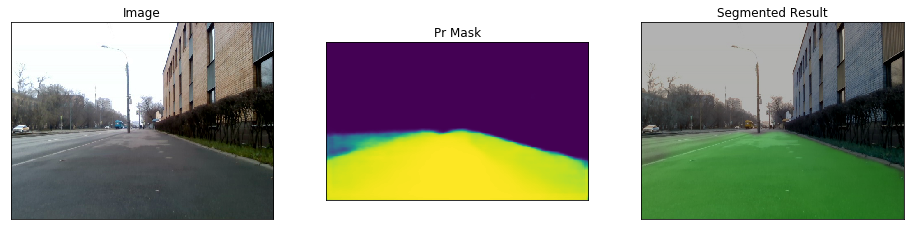

 22%|██▏       | 29/131 [00:06<00:21,  4.71it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0091 seconds


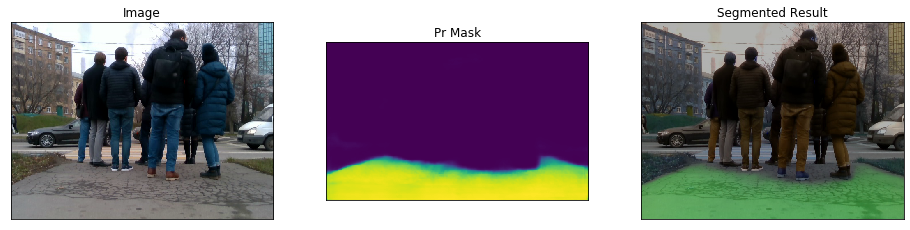

 23%|██▎       | 30/131 [00:06<00:21,  4.65it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0088 seconds


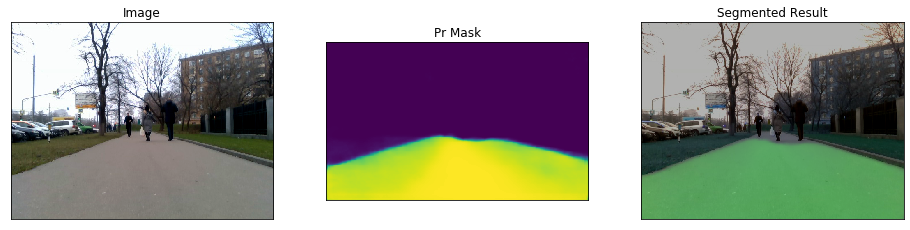

 24%|██▎       | 31/131 [00:06<00:21,  4.68it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0090 seconds


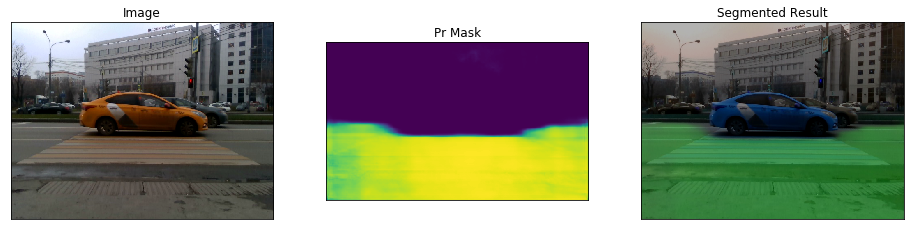

 24%|██▍       | 32/131 [00:06<00:21,  4.61it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0090 seconds


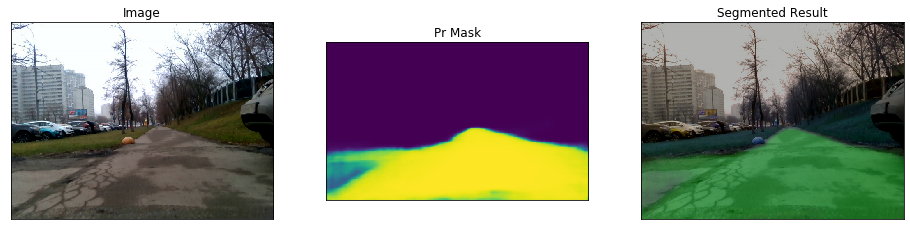

 25%|██▌       | 33/131 [00:07<00:21,  4.64it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0089 seconds


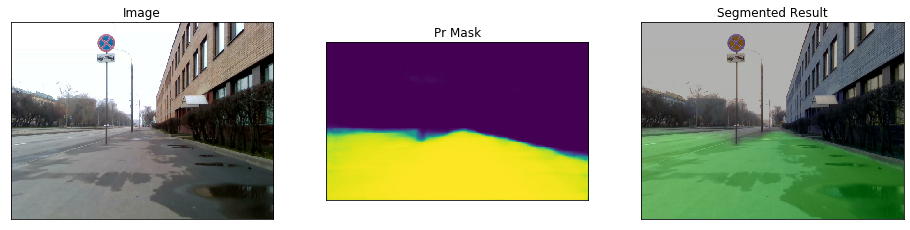

 26%|██▌       | 34/131 [00:07<00:20,  4.69it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0089 seconds


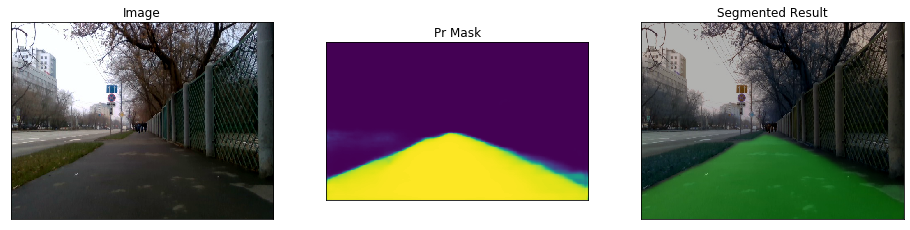

 27%|██▋       | 35/131 [00:07<00:20,  4.69it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0092 seconds


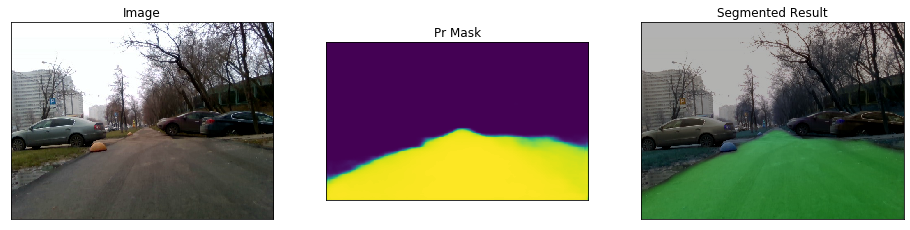

 27%|██▋       | 36/131 [00:07<00:20,  4.71it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0092 seconds


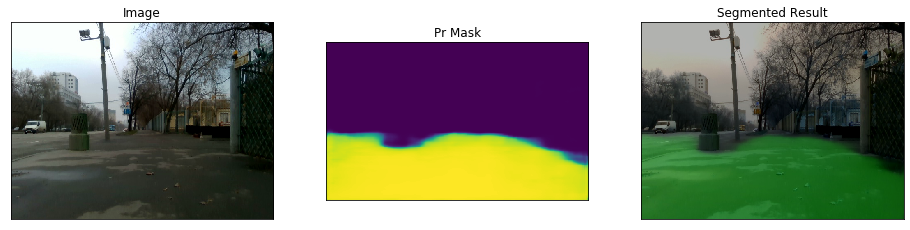

 28%|██▊       | 37/131 [00:07<00:20,  4.64it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0089 seconds


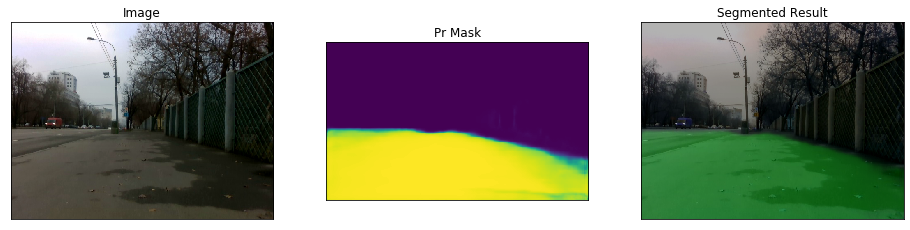

 29%|██▉       | 38/131 [00:08<00:20,  4.65it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0091 seconds


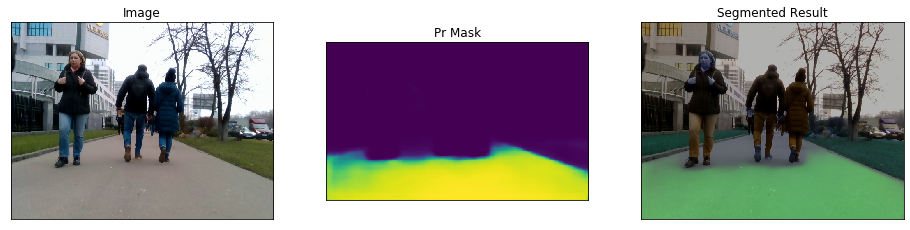

 30%|██▉       | 39/131 [00:08<00:27,  3.32it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0092 seconds


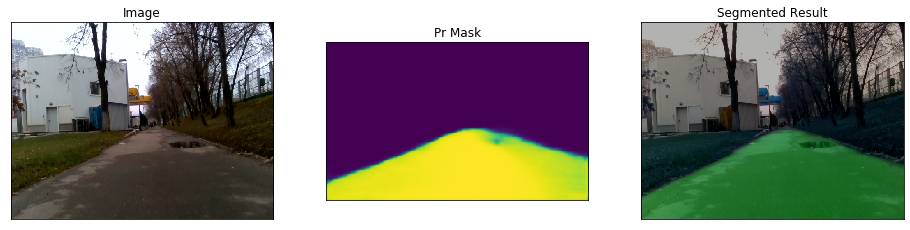

 31%|███       | 40/131 [00:08<00:25,  3.62it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0093 seconds


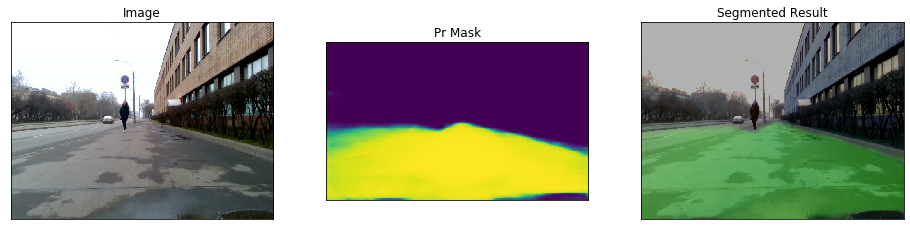

 31%|███▏      | 41/131 [00:09<00:23,  3.91it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0090 seconds


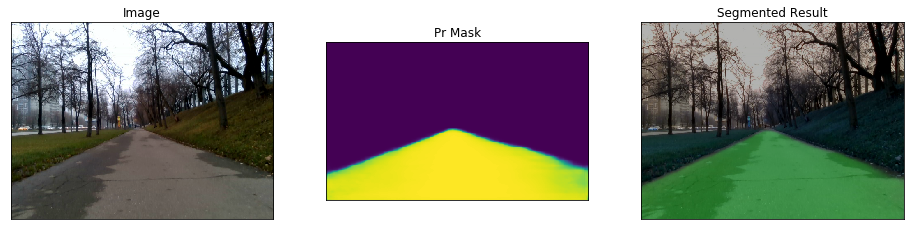

 32%|███▏      | 42/131 [00:09<00:21,  4.11it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0092 seconds


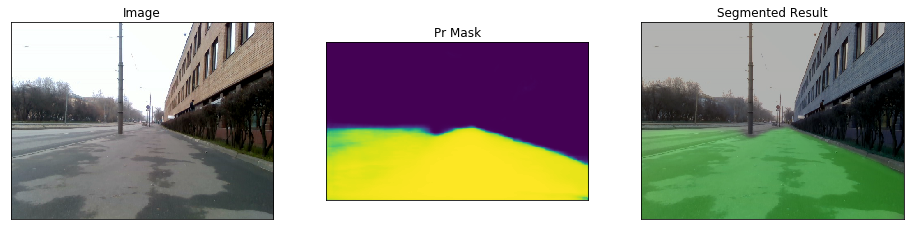

 33%|███▎      | 43/131 [00:09<00:20,  4.31it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0093 seconds


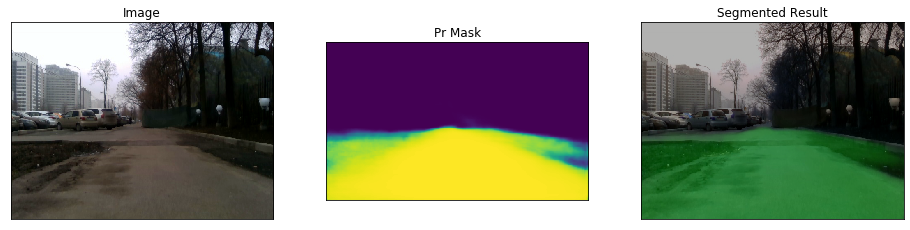

 34%|███▎      | 44/131 [00:09<00:19,  4.41it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0091 seconds


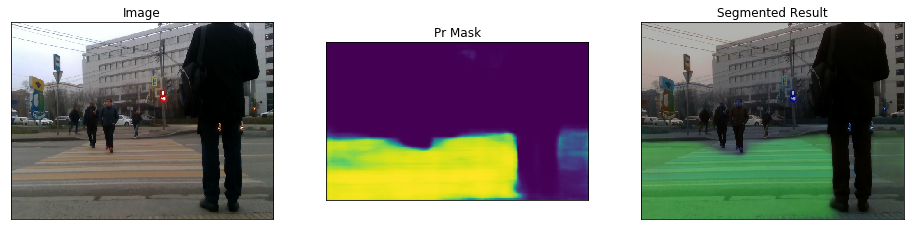

 34%|███▍      | 45/131 [00:09<00:19,  4.40it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0084 seconds


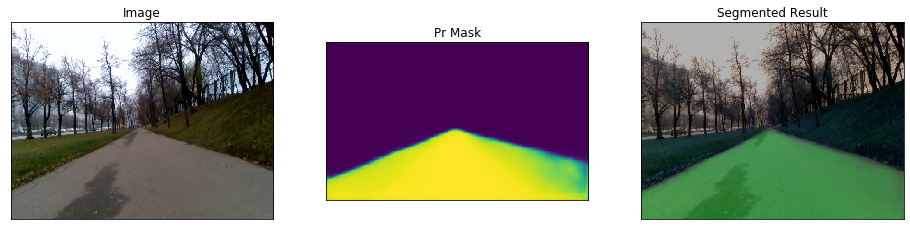

 35%|███▌      | 46/131 [00:10<00:19,  4.44it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0088 seconds


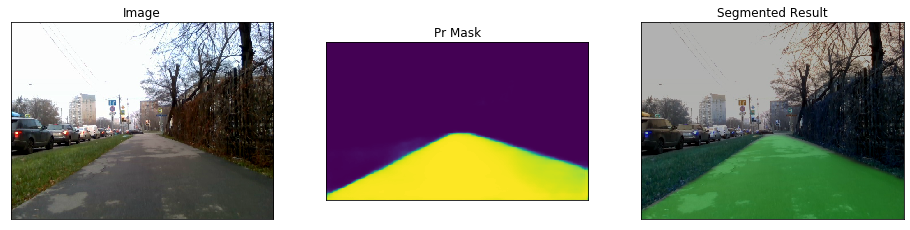

 36%|███▌      | 47/131 [00:10<00:18,  4.54it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0091 seconds


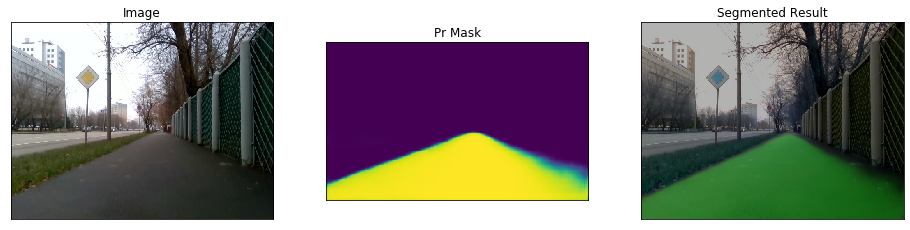

 37%|███▋      | 48/131 [00:10<00:18,  4.61it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0093 seconds


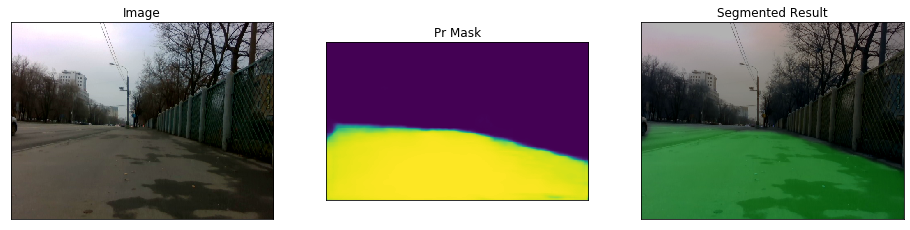

 37%|███▋      | 49/131 [00:10<00:17,  4.64it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0089 seconds


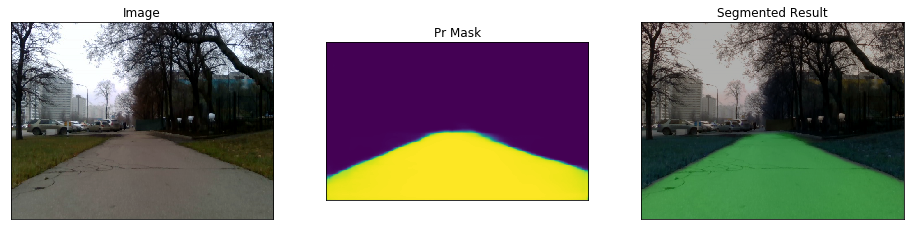

 38%|███▊      | 50/131 [00:11<00:17,  4.66it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0090 seconds


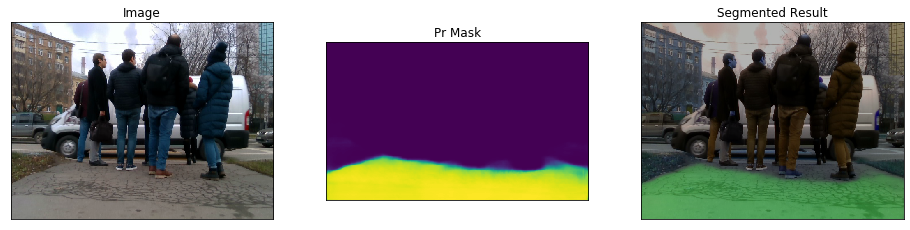

 39%|███▉      | 51/131 [00:11<00:17,  4.63it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0090 seconds


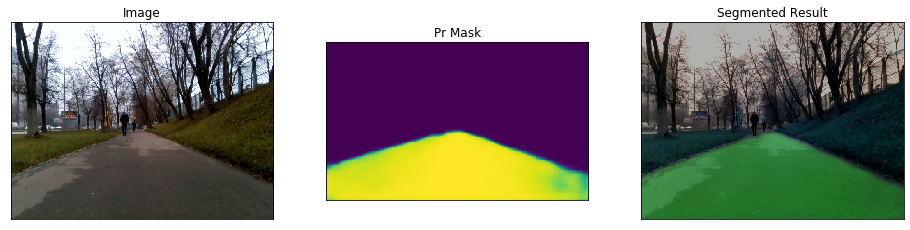

 40%|███▉      | 52/131 [00:11<00:16,  4.65it/s]

(1, 192, 320, 3)
[INFO] single frame of size (192, 320) took 0.0091 seconds


In [ ]:
PATH_TO_FRAMES = '../Semantic_Segmentation/Tensorflow_Deeplab_ModelZoo/frames/'
FPS = []
for im_path in tqdm( os.listdir(PATH_TO_FRAMES) ):
    # get raw frames from video stream
    frame_raw = cv2.imread(os.path.join(PATH_TO_FRAMES, im_path))
    
    # preprocess raw frames
    frame = image_preprocessing(frame_raw)
    # predict segmentation mask from the frame
    start = time.time()
    pr_mask = model.predict(frame)
    end = time.time()
    dt = end-start
    FPS.append(1./dt)
    segmented_result = visual_seg_result(frame_raw[:,:,(2,1,0)], pr_mask)
    print("[INFO] single frame of size {} took {:.4f} seconds".format(frame.shape[1:3], dt))

    visualize(
        image=denormalize(frame_raw[:,:,(2,1,0)]),
        pr_mask=pr_mask.squeeze(),
        segmented_result=segmented_result
    )

print("[INFO] Mean FPS {:.4f} Hz".format(np.mean(FPS)))


### Test on a video example

In [11]:
import imutils
from tqdm import tqdm


PATH_TO_VIDEO = '../Semantic_Segmentation/Tensorflow_Deeplab_ModelZoo/way_back.avi'
vs = cv2.VideoCapture(PATH_TO_VIDEO)
writer = None

# try to determine the total number of frames in the video file
try:
    prop =  cv2.cv.CV_CAP_PROP_FRAME_COUNT if imutils.is_cv2() \
        else cv2.CAP_PROP_FRAME_COUNT
    total = int(vs.get(prop))
    print("[INFO] {} total frames in video".format(total))
# an error occurred while trying to determine the total
# number of frames in the video file
except:
    print("[INFO] could not determine # of frames in video")
    total = -1

FPS = []
while(1):
# for i in tqdm( range(50) ):
    # get raw frames from video stream
    ret, frame_raw = vs.read()
    if ret == False:
        break
    # preprocess raw frames
    start = time.time()
    frame = preprocess_input(frame_raw)
    frame = np.expand_dims(frame, axis=0)
    # predict segmentation mask from the frame
    pr_mask = model.predict(frame)
    end = time.time()
    dt = end-start
    FPS.append(1./dt)
    segmented_result = visual_seg_result(frame_raw, pr_mask)
#     print("[INFO] single frame took {:.4f} seconds".format(dt))
    
    # check if the video writer is None
    if writer is None:
        # initialize our video writer
        fourcc = cv2.VideoWriter_fourcc(*"MJPG")
        writer = cv2.VideoWriter('sidewalk_forward_{}.avi'.format(BACKBONE), fourcc, 30,
            (640, 480), True)

        # some information on processing single frame
        if total > 0:
            elap = (end - start)
            print("[INFO] single frame took {:.4f} seconds".format(elap))
            print("[INFO] estimated total time: {:.4f} [min]".format(elap * total/60.))

    # write the output frame to disk
    writer.write(np.uint8(255*segmented_result))

#     visualize(
#     image=denormalize(frame.squeeze()),
#     pr_mask=pr_mask.squeeze(),
#     )

print("[INFO] Mean FPS {:.4f} Hz".format(np.mean(FPS)))


[INFO] 17297 total frames in video

[INFO] single frame took 2.0106 seconds
[INFO] estimated total time: 579.6108 [min]
[INFO] Mean FPS 50.0217 Hz


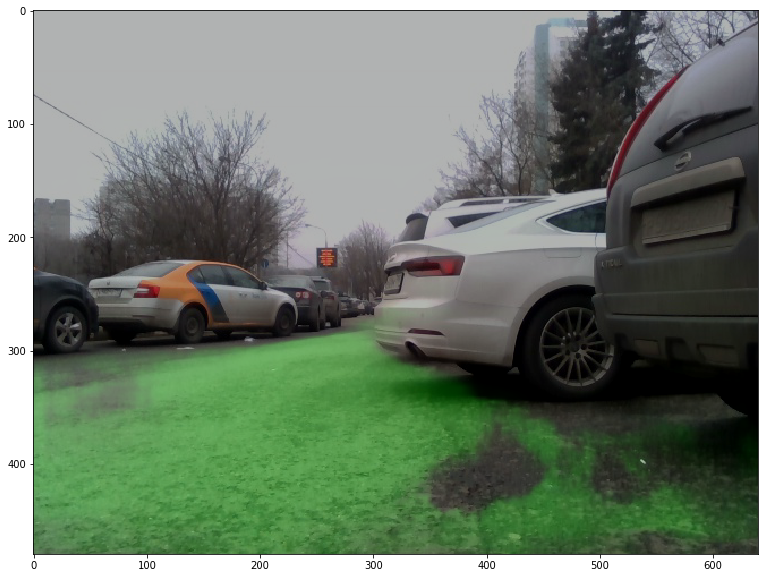

In [12]:
plt.figure(figsize=(15,10))
plt.imshow(np.uint8(255*segmented_result[:,:,(2,1,0)]))